<a href="https://colab.research.google.com/github/HaiderAli-Awan/GENDER-AND-AGE-DETECTION-USING-OPEN-CV-for-Single-Face-in-Vedio/blob/main/AGE%20AND%20GENDER%20DETECTION%20WITH%20FAST%20API.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Step 1: Install necessary libraries (only needed for Colab)
!pip install ultralytics opencv-python-headless

import numpy as np
import cv2
from ultralytics import YOLO
import random
from google.colab.patches import cv2_imshow

# Step 2: Mount Google Drive (optional, if you want to load files from Drive)
from google.colab import drive
drive.mount('/content/drive')

# Load COCO classes file (adjust the path if using Google Drive)
my_file = open("/content/drive/MyDrive/coco.txt", "r")
data = my_file.read()
class_list = data.split("\n")
my_file.close()

# Generate random colors for class list
detection_colors = []
for i in range(len(class_list)):
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    detection_colors.append((b, g, r))

# Step 3: Load a pretrained YOLOv8n model (adjust the weights path if using Google Drive)
model = YOLO("/content/drive/MyDrive/weights/yolov8n.pt", "v8")

# Vals to resize video frames | small frame optimize the run
frame_wid = 640
frame_hyt = 480

# Step 4: Use a sample video from Google Drive or Colab
cap = cv2.VideoCapture("/content/drive/MyDrive/vedio.mp4")

if not cap.isOpened():
    print("Cannot open camera")
    exit()

# Set the frames per second and duration limits
fps = cap.get(cv2.CAP_PROP_FPS)  # Get the FPS of the video
frame_interval = int(fps / 10)  # Process only 10 frames per second
max_frames = 10 * 10  # 10 seconds * 10 frames per second = 100 frames max

ROI_number = 0  # Counter for saved objects
frame_count = 0  # Initialize frame counter

while True:
    ret, frame = cap.read()

    if not ret or frame_count >= max_frames:
        print("Reached the frame or time limit. Exiting ...")
        break

    # Process every `frame_interval` frames (only 10 per second)
    if frame_count % frame_interval == 0:
        # Predict on the frame
        detect_params = model.predict(source=[frame], conf=0.45, save=False)

        # Get detection data
        DP = detect_params[0].numpy()

        if len(DP) != 0:
            for i in range(len(detect_params[0])):  # Loop through detected objects
                boxes = detect_params[0].boxes
                box = boxes[i]  # Get box info for each detected object
                clsID = int(box.cls.numpy()[0])  # Class ID
                conf = box.conf.numpy()[0]  # Confidence score
                bb = box.xyxy.numpy()[0]  # Bounding box coordinates

                # Only process the 'person' class (class ID 0 in COCO)
                if clsID == 0:
                    # Draw rectangle around detected object
                    cv2.rectangle(
                        frame,
                        (int(bb[0]), int(bb[1])),  # Top-left corner of the box
                        (int(bb[2]), int(bb[3])),  # Bottom-right corner of the box
                        detection_colors[clsID],  # Color based on class ID
                        3,  # Box thickness
                    )

                    # Display class name (person) and confidence score
                    font = cv2.FONT_HERSHEY_COMPLEX
                    cv2.putText(
                        frame,
                        class_list[clsID] + " " + str(round(conf, 3)) + "%",  # Label + confidence
                        (int(bb[0]), int(bb[1]) - 10),  # Position for text
                        font,
                        1,
                        (255, 255, 255),  # Text color
                        2,
                    )

                    # Print bounding box information
                    print(f"Person detected with confidence {conf}: Bounding Box {bb}")

                    # Extract the bounding box coordinates
                    x1, y1, x2, y2 = map(int, bb)

                    # Extract the region of interest (ROI) from the frame
                    ROI = frame[y1:y2, x1:x2]

                    # Save the ROI as an image file
                    cv2.imwrite(f'Person_ROI_{ROI_number}.png', ROI)
                    ROI_number += 1  # Increment the counter for each saved image

        # Display the resulting frame (use cv2_imshow for Colab)
        cv2_imshow(frame)

    # Increment frame counter
    frame_count += 1

    # Terminate run when 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the capture
cap.release()
cv2.destroyAllWindows()


In [ ]:
# Step 1: Install necessary libraries (only needed for Colab)
!pip install ultralytics opencv-python-headless

import numpy as np
import cv2
from ultralytics import YOLO
import random
from google.colab.patches import cv2_imshow

# Step 2: Mount Google Drive (optional, if you want to load files from Drive)
from google.colab import drive
drive.mount('/content/drive')

# Load COCO classes file (adjust the path if using Google Drive)
my_file = open("/content/drive/MyDrive/coco.txt", "r")
data = my_file.read()
class_list = data.split("\n")
my_file.close()

# Generate random colors for class list
detection_colors = []
for i in range(len(class_list)):
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    detection_colors.append((b, g, r))

# Step 3: Load a pretrained YOLOv8n model (adjust the weights path if using Google Drive)
model = YOLO("/content/drive/MyDrive/weights/yolov8n.pt", "v8")

# Vals to resize video frames | small frame optimize the run
frame_wid = 640
frame_hyt = 480

# Step 4: Use a sample video from Google Drive or Colab
cap = cv2.VideoCapture("/content/drive/MyDrive/vedio.mp4")

if not cap.isOpened():
    print("Cannot open camera")
    exit()

# Set the frames per second and duration limits
fps = cap.get(cv2.CAP_PROP_FPS)  # Get the FPS of the video
frame_interval = int(fps / 10)  # Process only 10 frames per second
max_frames = 10 * 10  # 10 seconds * 10 frames per second = 100 frames max

ROI_number = 0  # Counter for saved objects
frame_count = 0  # Initialize frame counter

while True:
    ret, frame = cap.read()

    if not ret or frame_count >= max_frames:
        print("Reached the frame or time limit. Exiting ...")
        break

    # Process every `frame_interval` frames (only 10 per second)
    if frame_count % frame_interval == 0:
        # Predict on the frame
        detect_params = model.predict(source=[frame], conf=0.45, save=False)

        # Get detection data
        DP = detect_params[0].numpy()

        if len(DP) != 0:
            for i in range(len(detect_params[0])):  # Loop through detected objects
                boxes = detect_params[0].boxes
                box = boxes[i]  # Get box info for each detected object
                clsID = int(box.cls.numpy()[0])  # Class ID
                conf = box.conf.numpy()[0]  # Confidence score
                bb = box.xyxy.numpy()[0]  # Bounding box coordinates

                # Only process the 'person' class (class ID 0 in COCO)
                if clsID == 0:
                    # Draw rectangle around detected object
                    cv2.rectangle(
                        frame,
                        (int(bb[0]), int(bb[1])),  # Top-left corner of the box
                        (int(bb[2]), int(bb[3])),  # Bottom-right corner of the box
                        detection_colors[clsID],  # Color based on class ID
                        3,  # Box thickness
                    )

                    # Display class name (person) and confidence score
                    font = cv2.FONT_HERSHEY_COMPLEX
                    cv2.putText(
                        frame,
                        class_list[clsID] + " " + str(round(conf, 3)) + "%",  # Label + confidence
                        (int(bb[0]), int(bb[1]) - 10),  # Position for text
                        font,
                        1,
                        (255, 255, 255),  # Text color
                        2,
                    )

                    # Print bounding box information
                    print(f"Person detected with confidence {conf}: Bounding Box {bb}")

                    # Extract the bounding box coordinates
                    x1, y1, x2, y2 = map(int, bb)

                    # Extract the region of interest (ROI) from the frame
                    ROI = frame[y1:y2, x1:x2]

                    # Save the ROI as an image file
                    cv2.imwrite(f'Person_ROI_{ROI_number}.png', ROI)
                    ROI_number += 1  # Increment the counter for each saved image

        # Display the resulting frame (use cv2_imshow for Colab)
        cv2_imshow(frame)

    # Increment frame counter
    frame_count += 1

    # Terminate run when 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the capture
cap.release()
cv2.destroyAllWindows()

# Output total frames processed
print(f"Total frames processed: {frame_count}")


In [ ]:
# Step 1: Install necessary libraries (only needed for Colab)
!pip install ultralytics opencv-python-headless

import numpy as np
import cv2
from ultralytics import YOLO
import random
from google.colab.patches import cv2_imshow

# Step 2: Mount Google Drive (optional, if you want to load files from Drive)
from google.colab import drive
drive.mount('/content/drive')

# Load COCO classes file (adjust the path if using Google Drive)
my_file = open("/content/drive/MyDrive/coco.txt", "r")
data = my_file.read()
class_list = data.split("\n")
my_file.close()

# Generate random colors for class list
detection_colors = []
for i in range(len(class_list)):
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    detection_colors.append((b, g, r))

# Step 3: Load a pretrained YOLOv8n model (adjust the weights path if using Google Drive)
model = YOLO("/content/drive/MyDrive/weights/yolov8n.pt", "v8")

# Vals to resize video frames | small frame optimize the run
frame_wid = 640
frame_hyt = 480

# Step 4: Use a sample video from Google Drive or Colab
cap = cv2.VideoCapture("/content/drive/MyDrive/vedio.mp4")

if not cap.isOpened():
    print("Cannot open camera")
    exit()

# Set the frames per second and duration limits
fps = cap.get(cv2.CAP_PROP_FPS)  # Get the FPS of the video
frame_interval = int(fps / 10)  # Process only 10 frames per second
max_frames = 10 * 10  # 10 seconds * 10 frames per second = 100 frames max

ROI_number = 0  # Counter for saved objects
frame_count = 0  # Initialize frame counter
cropped_images = []  # List to store cropped images and their details

while True:
    ret, frame = cap.read()

    if not ret or frame_count >= max_frames:
        print("Reached the frame or time limit. Exiting ...")
        break

    # Process every `frame_interval` frames (only 10 per second)
    if frame_count % frame_interval == 0:
        # Predict on the frame
        detect_params = model.predict(source=[frame], conf=0.45, save=False)

        # Get detection data
        DP = detect_params[0].numpy()

        if len(DP) != 0:
            for i in range(len(detect_params[0])):  # Loop through detected objects
                boxes = detect_params[0].boxes
                box = boxes[i]  # Get box info for each detected object
                clsID = int(box.cls.numpy()[0])  # Class ID
                conf = box.conf.numpy()[0]  # Confidence score
                bb = box.xyxy.numpy()[0]  # Bounding box coordinates

                # Only process the 'person' class (class ID 0 in COCO)
                if clsID == 0:
                    # Extract the bounding box coordinates
                    x1, y1, x2, y2 = map(int, bb)

                    # Extract the region of interest (ROI) from the frame
                    ROI = frame[y1:y2, x1:x2]

                    # Save the ROI and details in the list for later display
                    cropped_images.append((ROI, class_list[clsID], conf))

                    # Save the ROI as an image file
                    cv2.imwrite(f'Person_ROI_{ROI_number}.png', ROI)
                    ROI_number += 1  # Increment the counter for each saved image

        # Display the resulting frame (use cv2_imshow for Colab)
        cv2_imshow(frame)

    # Increment frame counter
    frame_count += 1

    # Terminate run when 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the capture
cap.release()
cv2.destroyAllWindows()

# Output total frames processed
print(f"Total frames processed: {frame_count}")

# Step 5: Display each cropped image with class and confidence
for idx, (cropped_img, class_name, confidence) in enumerate(cropped_images):
    # Show the cropped image
    print(f"Displaying cropped image {idx + 1}: Class = {class_name}, Confidence = {round(confidence, 2)}")
    cv2_imshow(cropped_img)
##THIS THE MAIN CODE TO USE FOR FYP OTHERS ARE TESTING


0: 480x640 8 persons, 12.2ms
Speed: 2.0ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


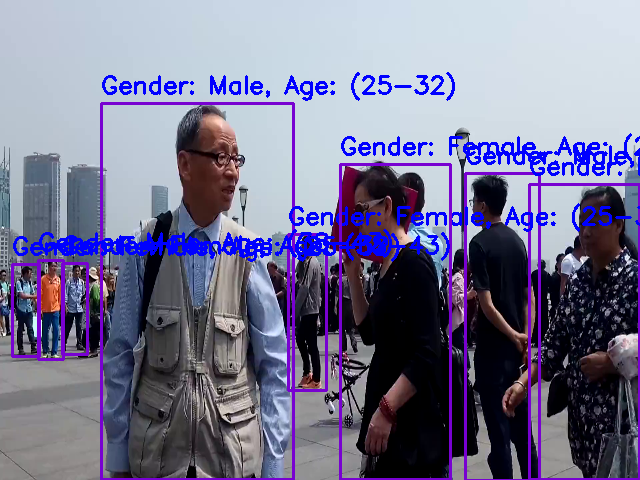

Frame 0: Detected 8 persons.

0: 480x640 7 persons, 8.6ms
Speed: 1.9ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


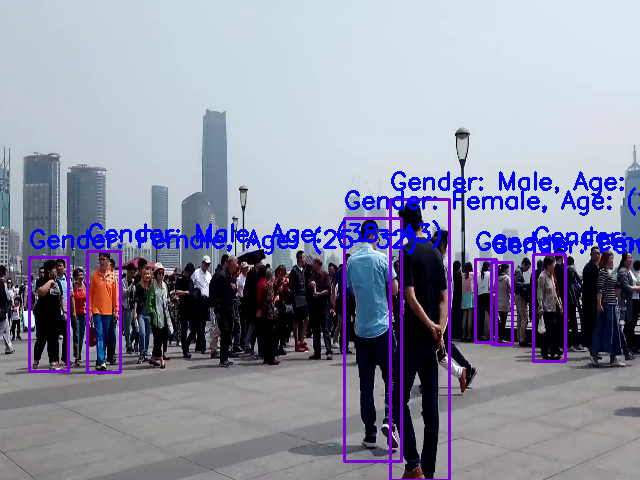

Frame 6: Detected 7 persons.

0: 480x640 9 persons, 19.2ms
Speed: 2.9ms preprocess, 19.2ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


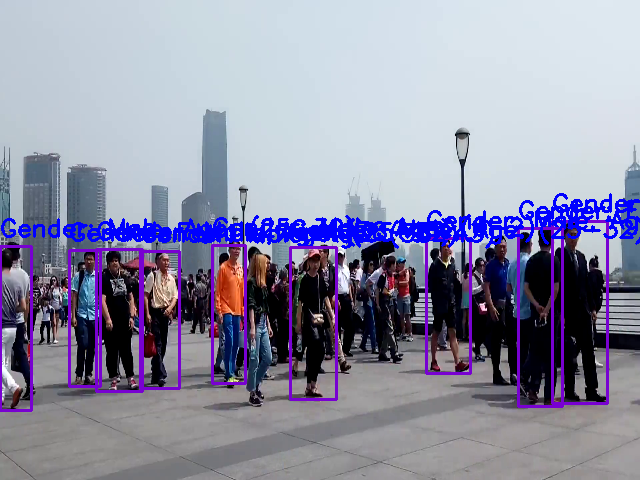

Frame 12: Detected 9 persons.

0: 480x640 13 persons, 13.7ms
Speed: 6.9ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


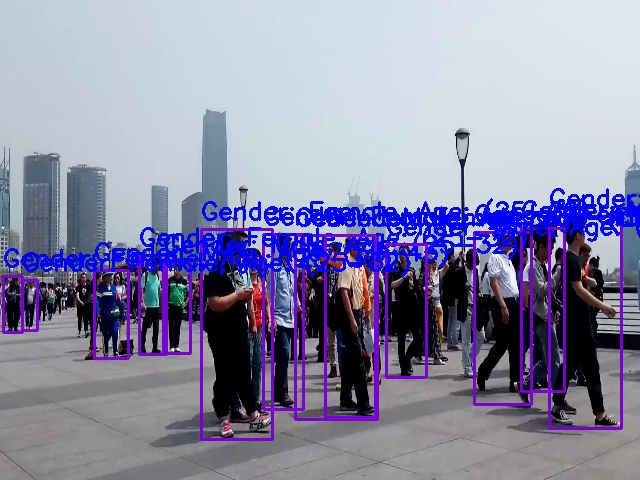

Frame 18: Detected 13 persons.

0: 480x640 10 persons, 21.6ms
Speed: 3.8ms preprocess, 21.6ms inference, 4.8ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


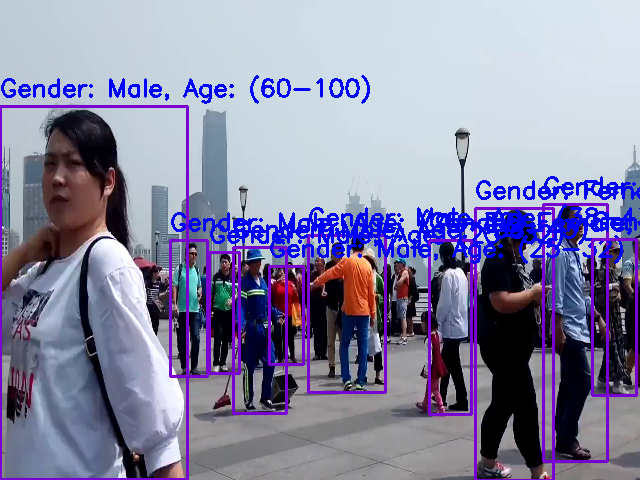

Frame 24: Detected 10 persons.

0: 480x640 12 persons, 34.5ms
Speed: 1.9ms preprocess, 34.5ms inference, 9.5ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


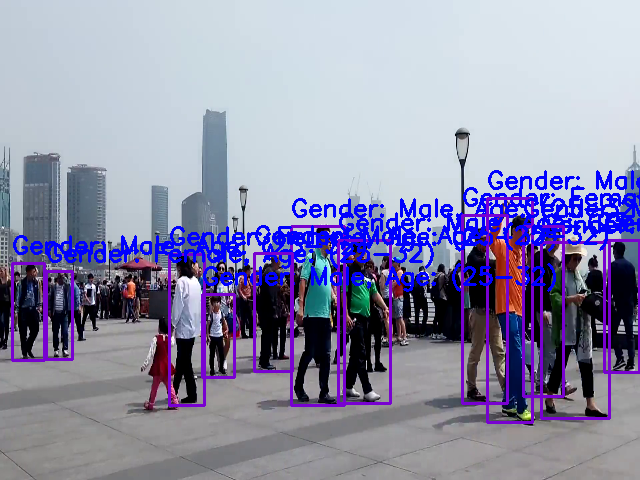

Frame 30: Detected 12 persons.

0: 480x640 9 persons, 19.1ms
Speed: 1.9ms preprocess, 19.1ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


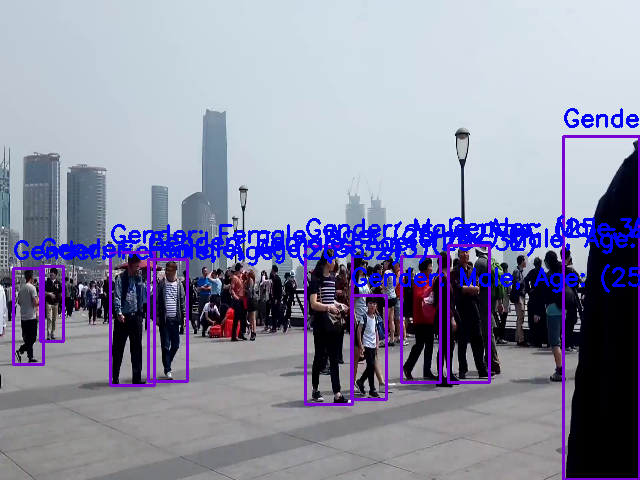

Frame 36: Detected 9 persons.

0: 480x640 13 persons, 21.0ms
Speed: 1.9ms preprocess, 21.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


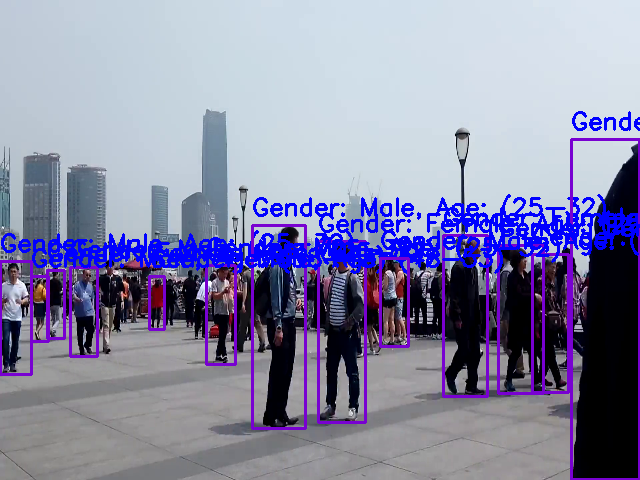

Frame 42: Detected 13 persons.

0: 480x640 5 persons, 17.5ms
Speed: 1.9ms preprocess, 17.5ms inference, 6.1ms postprocess per image at shape (1, 3, 480, 640)
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


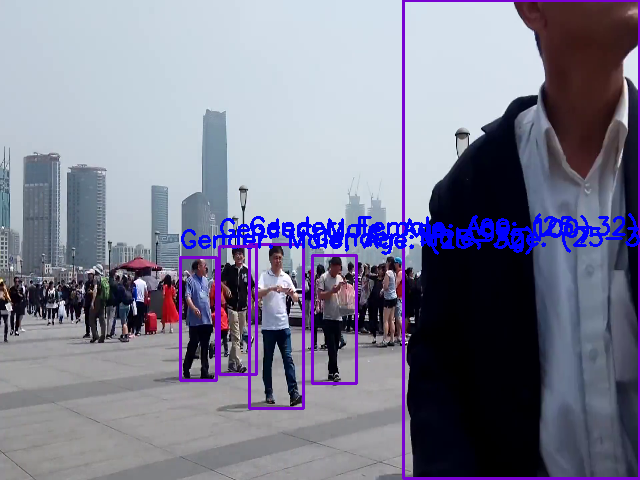

Frame 48: Detected 5 persons.
Total Males Detected: 55
Male Ages: ['(25-32)', '(38-43)', '(25-32)', '(38-43)', '(38-43)', '(38-43)', '(38-43)', '(38-43)', '(25-32)', '(60-100)', '(25-32)', '(38-43)', '(0-2)', '(25-32)', '(25-32)', '(38-43)', '(25-32)', '(25-32)', '(38-43)', '(25-32)', '(60-100)', '(38-43)', '(38-43)', '(38-43)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(38-43)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(38-43)', '(25-32)', '(25-32)', '(48-53)', '(25-32)', '(38-43)', '(25-32)', '(25-32)', '(60-100)']
Total Females Detected: 31
Female Ages: ['(25-32)', '(25-32)', '(25-32)', '(38-43)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(38-43)', '(38-43)', '(25-32)', '(25-32)', '(38-43)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(25-32)', '(38-43)', 

In [3]:
!pip install ultralytics opencv-python-headless

import numpy as np
import cv2
from ultralytics import YOLO
import random
import time
import os
from google.colab.patches import cv2_imshow
# Create a folder for saving person images if it doesn't exist
os.makedirs("detect", exist_ok=True)

# Load COCO classes file (adjust the path if using Google Drive)
my_file = open("/content/coco.txt", "r")
data = my_file.read()
class_list = data.split("\n")
my_file.close()

# Generate random colors for class list
detection_colors = []
for i in range(len(class_list)):
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    detection_colors.append((b, g, r))

# Load a pretrained YOLOv8n model
model = YOLO("/content/yolov8n.pt", "v8")

# Vals to resize video frames | small frame optimize the run
frame_wid = 640
frame_hyt = 480

# Load gender and age models
FACE_PROTO = "/content/opencv_face_detector.pbtxt"
FACE_MODEL = "/content/opencv_face_detector_uint8.pb"
AGE_PROTO = "/content/age_deploy.prototxt"
AGE_MODEL = "/content/age_net.caffemodel"
GENDER_PROTO = "/content/gender_deploy.prototxt"
GENDER_MODEL = "/content/gender_net.caffemodel"
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
AGELIST = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
GENDERLIST = ['Male', 'Female']

# Load Networks
face_net = cv2.dnn.readNetFromTensorflow(FACE_MODEL, FACE_PROTO)
age_net = cv2.dnn.readNet(AGE_MODEL, AGE_PROTO)
gender_net = cv2.dnn.readNet(GENDER_MODEL, GENDER_PROTO)

# Step 4: Use a sample video from Google Drive or Colab
cap = cv2.VideoCapture("/content/vedio.mp4")

if not cap.isOpened():
    print("Cannot open video")
    exit()

fps = 5  # Frames per second (extract 2 frames per second)
total_duration = 10  # Process only the first 10 seconds
total_frames = fps * total_duration  # Total frames to process
frame_interval = int(cap.get(cv2.CAP_PROP_FPS) / fps)  # Interval between frames to skip

padding = 20
frame_count = 0

# Counters for total male and female counts
total_male_count = 0
total_female_count = 0

# Dictionary to hold ages
male_ages = []
female_ages = []

while frame_count < total_frames:
    ret, frame = cap.read()
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break

    # Skip frames to achieve the desired fps (2 frames per second)
    if frame_count % frame_interval == 0:
        # Resize frame for faster processing
        frame = cv2.resize(frame, (frame_wid, frame_hyt))

        # YOLO Prediction on current frame
        detect_params = model.predict(source=[frame], conf=0.45, save=False)

        # Get detection data
        DP = detect_params[0].cpu().numpy()

        person_count = 0  # To count the number of persons

        if len(DP) != 0:
            for i in range(len(detect_params[0])):  # Loop through detected objects
                boxes = detect_params[0].boxes
                box = boxes[i]  # Get box info for each detected object
                clsID = box.cls.cpu().numpy()[0]  # Class ID
                conf = box.conf.cpu().numpy()[0]  # Confidence score
                bb = box.xyxy.cpu().numpy()[0]  # Bounding box coordinates
                print(box.cls.device)  # Check if tensor is on 'cuda:0' or 'cpu'


                if class_list[int(clsID)] == 'person':  # Process only persons
                    person_count += 1
                    # Extract detected person as an image
                    person_img = frame[int(bb[1]):int(bb[3]), int(bb[0]):int(bb[2])]

                    # Save detected person image
                    img_name = f"detect/person_{frame_count}_{i}.png"
                    cv2.imwrite(img_name, person_img)

                    # Use the saved person image for age and gender prediction
                    person_img = cv2.imread(img_name)
                    person_img_resized = cv2.resize(person_img, (227, 227))
                    blob = cv2.dnn.blobFromImage(person_img_resized, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)

                    # Gender Prediction
                    gender_net.setInput(blob)
                    gender_preds = gender_net.forward()
                    gender = GENDERLIST[gender_preds[0].argmax()]

                    # Age Prediction
                    age_net.setInput(blob)
                    age_preds = age_net.forward()
                    age = AGELIST[age_preds[0].argmax()]

                    label = f"Gender: {gender}, Age: {age}"

                    # Add text with predictions on the image
                    cv2.putText(frame, label, (int(bb[0]), int(bb[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

                    # Count gender and record age
                    if gender == 'Male':
                        total_male_count += 1
                        male_ages.append(age)
                    else:
                        total_female_count += 1
                        female_ages.append(age)

                    # Draw bounding box around the person
                    cv2.rectangle(frame, (int(bb[0]), int(bb[1])), (int(bb[2]), int(bb[3])), detection_colors[int(clsID)], 2)

        # Display the resulting frame with predictions
        cv2_imshow(frame)
        print(f"Frame {frame_count}: Detected {person_count} persons.")

        # Save the frame with bounding boxes and labels as an image
        frame_output_name = f"detect/frame_{frame_count}.png"
        cv2.imwrite(frame_output_name, frame)

    frame_count += 1

# Release the capture and destroy windows
cap.release()
#cv2.destroyAllWindows()

# Output the total counts and ages
print(f"Total Males Detected: {total_male_count}")
print(f"Male Ages: {male_ages}")
print(f"Total Females Detected: {total_female_count}")
print(f"Female Ages: {female_ages}")


In [4]:
model.save("gender_and_age_detection.pt")


In [5]:
# Perform YOLO prediction
detect_params = model.predict(source=[frame], conf=0.45, save=False)

# Process results
results = detect_params[0]  # First frame's results (if processing a video or image batch)
for box in results.boxes:  # Loop through all detected boxes
    # Extract data
    cls_id = int(box.cls.cpu().numpy()[0])  # Class ID
    conf = float(box.conf.cpu().numpy()[0])  # Confidence score
    bb = box.xyxy.cpu().numpy()[0]  # Bounding box coordinates (x1, y1, x2, y2)

    # Get class name
    class_name = class_list[cls_id]  # Using the COCO class list loaded earlier

    # Print or store results
    print(f"Detected: {class_name}, Confidence: {conf:.2f}, Bounding Box: {bb}")



0: 384x640 7 persons, 110.9ms
Speed: 4.8ms preprocess, 110.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Detected: person, Confidence: 0.95, Bounding Box: [       1215      5.5276      1918.5      1067.8]
Detected: person, Confidence: 0.81, Bounding Box: [     856.65         530      1010.8      955.99]
Detected: person, Confidence: 0.76, Bounding Box: [     631.23      572.81      761.74       867.3]
Detected: person, Confidence: 0.73, Bounding Box: [     987.83      567.83      1118.7      871.91]
Detected: person, Confidence: 0.71, Bounding Box: [     744.68      539.44       862.7      855.87]
Detected: person, Confidence: 0.54, Bounding Box: [     469.18      594.14       545.1      805.48]
Detected: person, Confidence: 0.45, Bounding Box: [     200.34      606.07      259.95      771.38]



0: 480x640 8 persons, 9.7ms
Speed: 1.7ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


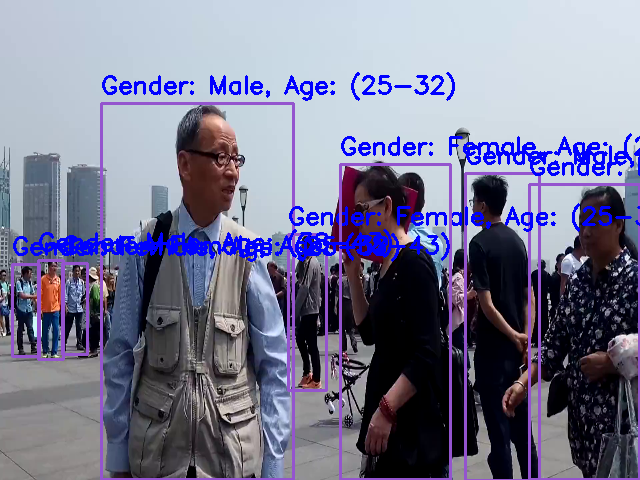

Frame 0: Detected 8 persons.

0: 480x640 7 persons, 10.3ms
Speed: 2.1ms preprocess, 10.3ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


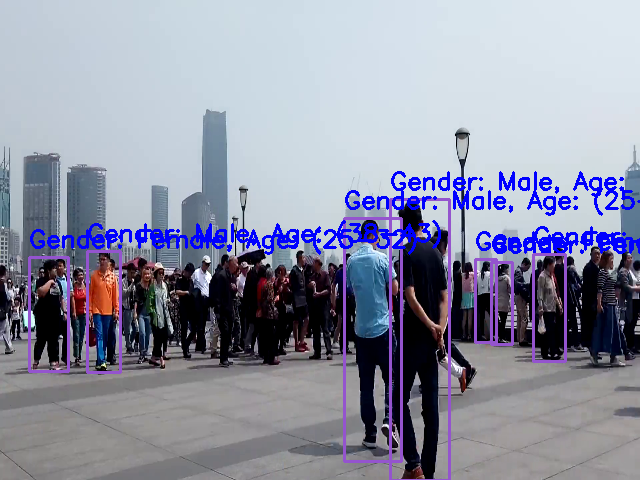

Frame 6: Detected 7 persons.

0: 480x640 9 persons, 15.1ms
Speed: 4.2ms preprocess, 15.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


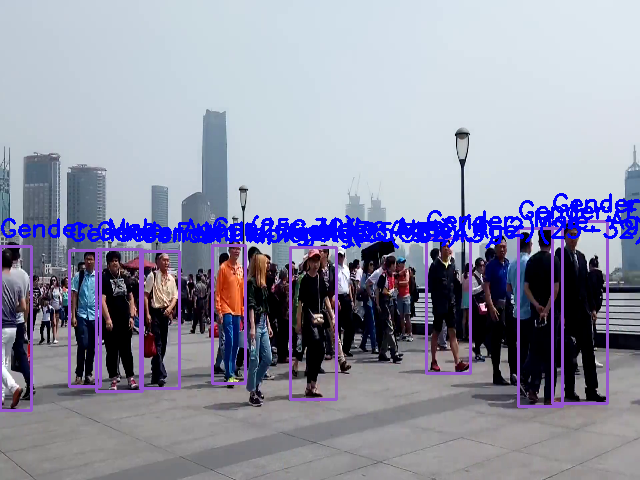

Frame 12: Detected 9 persons.

0: 480x640 13 persons, 14.7ms
Speed: 2.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


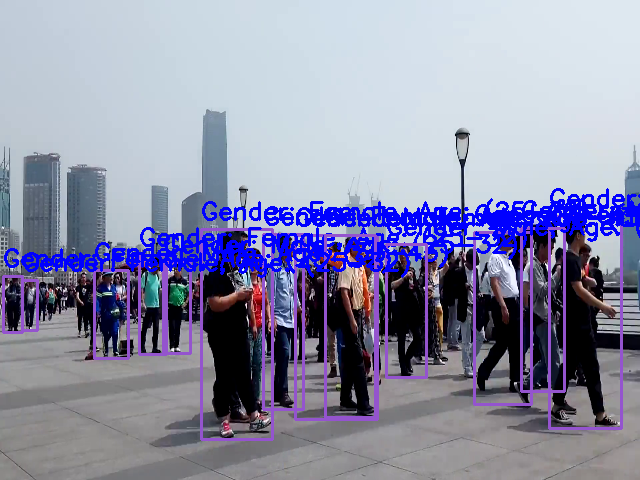

Frame 18: Detected 13 persons.

0: 480x640 10 persons, 19.4ms
Speed: 2.0ms preprocess, 19.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


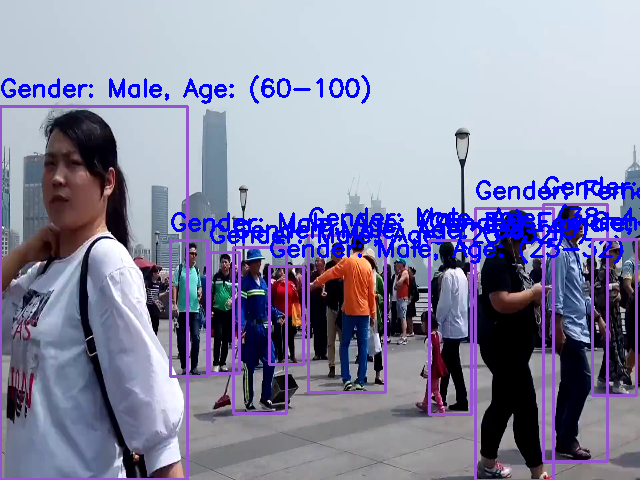

Frame 24: Detected 10 persons.

0: 480x640 12 persons, 19.8ms
Speed: 2.0ms preprocess, 19.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


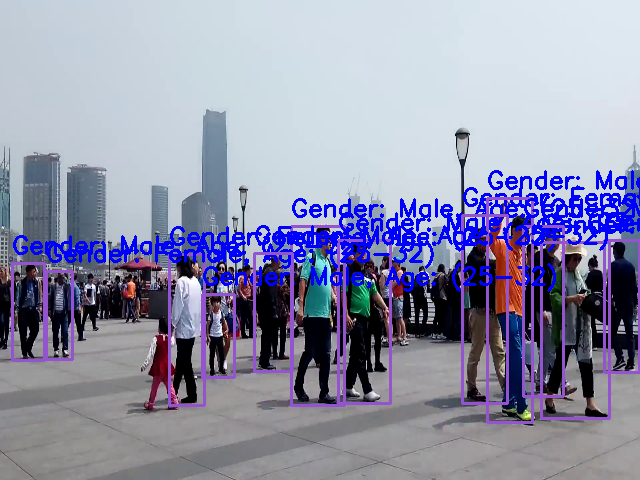

Frame 30: Detected 12 persons.

0: 480x640 9 persons, 20.4ms
Speed: 1.9ms preprocess, 20.4ms inference, 6.7ms postprocess per image at shape (1, 3, 480, 640)


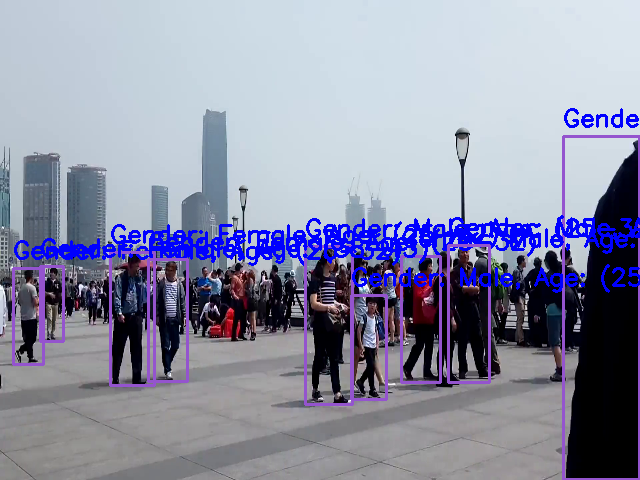

Frame 36: Detected 9 persons.

0: 480x640 13 persons, 14.3ms
Speed: 5.0ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


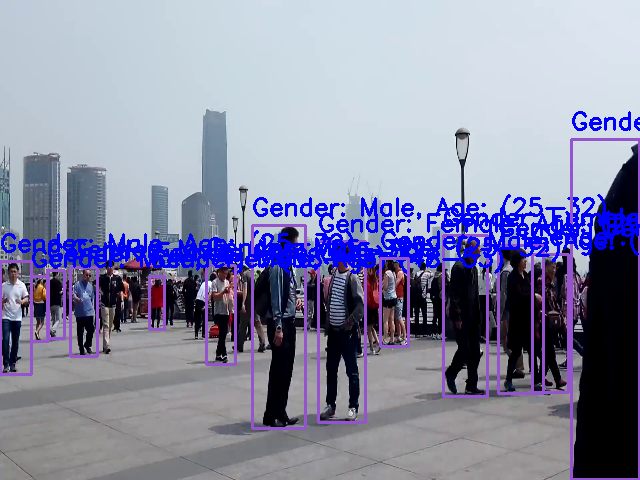

Frame 42: Detected 13 persons.

0: 480x640 5 persons, 9.2ms
Speed: 2.1ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


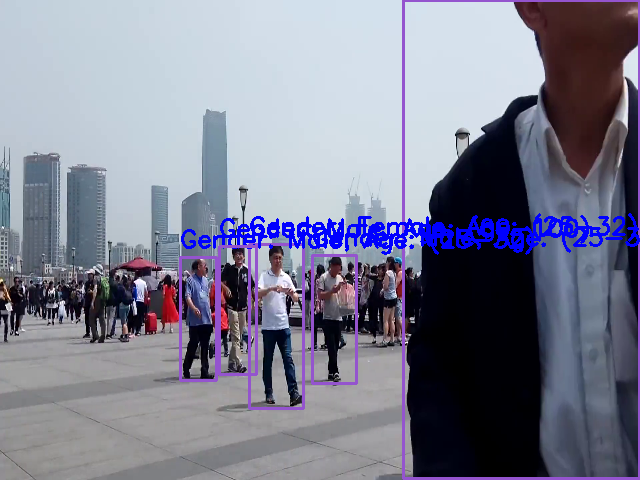

Frame 48: Detected 5 persons.
True Positives: 76
False Positives: 10
False Negatives: 10
Precision: 0.88
Recall: 0.88
F1-Score: 0.88


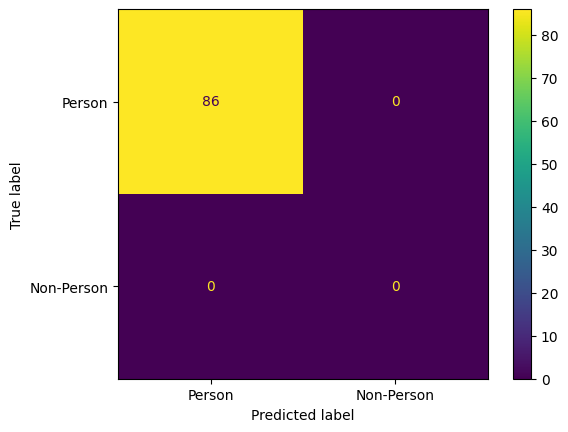

In [6]:
!pip install ultralytics opencv-python-headless scikit-learn

import numpy as np
import cv2
from ultralytics import YOLO
import random
import time
import os
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from google.colab.patches import cv2_imshow

# Create a folder for saving person images if it doesn't exist
os.makedirs("detect", exist_ok=True)

# Load COCO classes file (adjust the path if using Google Drive)
my_file = open("/content/coco.txt", "r")
data = my_file.read()
class_list = data.split("\n")
my_file.close()

# Generate random colors for class list
detection_colors = []
for i in range(len(class_list)):
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    detection_colors.append((b, g, r))

# Load a pretrained YOLOv8n model
model = YOLO("/content/yolov8n.pt", "v8")

# Vals to resize video frames | small frame optimize the run
frame_wid = 640
frame_hyt = 480

# Load gender and age models
FACE_PROTO = "/content/opencv_face_detector.pbtxt"
FACE_MODEL = "/content/opencv_face_detector_uint8.pb"
AGE_PROTO = "/content/age_deploy.prototxt"
AGE_MODEL = "/content/age_net.caffemodel"
GENDER_PROTO = "/content/gender_deploy.prototxt"
GENDER_MODEL = "/content/gender_net.caffemodel"
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
AGELIST = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
GENDERLIST = ['Male', 'Female']

# Load Networks
face_net = cv2.dnn.readNetFromTensorflow(FACE_MODEL, FACE_PROTO)
age_net = cv2.dnn.readNet(AGE_MODEL, AGE_PROTO)
gender_net = cv2.dnn.readNet(GENDER_MODEL, GENDER_PROTO)

# Step 4: Use a sample video from Google Drive or Colab
cap = cv2.VideoCapture("/content/vedio.mp4")

if not cap.isOpened():
    print("Cannot open video")
    exit()

fps = 5  # Frames per second (extract 2 frames per second)
total_duration = 10  # Process only the first 10 seconds
total_frames = fps * total_duration  # Total frames to process
frame_interval = int(cap.get(cv2.CAP_PROP_FPS) / fps)  # Interval between frames to skip

padding = 20
frame_count = 0

# Counters for total male and female counts
total_male_count = 0
total_female_count = 0

# Dictionary to hold ages
male_ages = []
female_ages = []

# Initialize counters for detection metrics
true_positives = 0
false_positives = 0
false_negatives = 0
ground_truth_count = 0  # Total actual persons (you may have this from labels or testing data)

# To store predictions and ground truth for confusion matrix
predicted_labels = []
ground_truth_labels = []

while frame_count < total_frames:
    ret, frame = cap.read()
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break

    # Skip frames to achieve the desired fps (2 frames per second)
    if frame_count % frame_interval == 0:
        # Resize frame for faster processing
        frame = cv2.resize(frame, (frame_wid, frame_hyt))

        # YOLO Prediction on current frame
        detect_params = model.predict(source=[frame], conf=0.45, save=False)

        # Get detection data
        DP = detect_params[0].cpu().numpy()

        person_count = 0  # To count the number of persons

        if len(DP) != 0:
            for i in range(len(detect_params[0])):  # Loop through detected objects
                boxes = detect_params[0].boxes
                box = boxes[i]  # Get box info for each detected object
                clsID = box.cls.cpu().numpy()[0]  # Class ID
                conf = box.conf.cpu().numpy()[0]  # Confidence score
                bb = box.xyxy.cpu().numpy()[0]  # Bounding box coordinates

                ground_truth_labels.append(1)  # Assuming actual ground truth is always 'person'

                if class_list[int(clsID)] == 'person':  # Process only persons
                    person_count += 1
                    ground_truth_count += 1  # Increment ground truth persons count
                    predicted_labels.append(1)  # YOLO predicted 'person'

                    # Use confidence score for true/false positive classification
                    if conf >= 0.5:
                        true_positives += 1  # High confidence, correct detection
                    else:
                        false_positives += 1  # Low confidence, incorrect detection

                    # Extract detected person as an image
                    person_img = frame[int(bb[1]):int(bb[3]), int(bb[0]):int(bb[2])]

                    # Save detected person image
                    img_name = f"detect/person_{frame_count}_{i}.png"
                    cv2.imwrite(img_name, person_img)

                    # Use the saved person image for age and gender prediction
                    person_img = cv2.imread(img_name)
                    person_img_resized = cv2.resize(person_img, (227, 227))
                    blob = cv2.dnn.blobFromImage(person_img_resized, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)

                    # Gender Prediction
                    gender_net.setInput(blob)
                    gender_preds = gender_net.forward()
                    gender = GENDERLIST[gender_preds[0].argmax()]

                    # Age Prediction
                    age_net.setInput(blob)
                    age_preds = age_net.forward()
                    age = AGELIST[age_preds[0].argmax()]

                    label = f"Gender: {gender}, Age: {age}"

                    # Add text with predictions on the image
                    cv2.putText(frame, label, (int(bb[0]), int(bb[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

                    # Count gender and record age
                    if gender == 'Male':
                        total_male_count += 1
                        male_ages.append(age)
                    else:
                        total_female_count += 1
                        female_ages.append(age)

                    # Draw bounding box around the person
                    cv2.rectangle(frame, (int(bb[0]), int(bb[1])), (int(bb[2]), int(bb[3])), detection_colors[int(clsID)], 2)
                else:
                    predicted_labels.append(0)  # YOLO predicted 'non-person'
                    false_positives += 1  # Detected but not a person (FP)

        # Display the resulting frame with predictions
        cv2_imshow(frame)
        print(f"Frame {frame_count}: Detected {person_count} persons.")

        # Save the frame with bounding boxes and labels as an image
        frame_output_name = f"detect/frame_{frame_count}.png"
        cv2.imwrite(frame_output_name, frame)

    frame_count += 1

# Calculate False Negatives
false_negatives = ground_truth_count - true_positives

# Calculate Precision, Recall, and F1-Score
precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

# Print Detection Metrics
print(f"True Positives: {true_positives}")
print(f"False Positives: {false_positives}")
print(f"False Negatives: {false_negatives}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1_score:.2f}")

# Confusion Matrix
cm = confusion_matrix(ground_truth_labels, predicted_labels, labels=[1, 0])  # 1: person, 0: non-person
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Person", "Non-Person"])
disp.plot()

# Save Metrics to File
with open("detection_metrics.txt", "w") as f:
    f.write(f"True Positives: {true_positives}\n")
    f.write(f"False Positives: {false_positives}\n")
    f.write(f"False Negatives: {false_negatives}\n")
    f.write(f"Precision: {precision:.2f}\n")
    f.write(f"Recall: {recall:.2f}\n")
    f.write(f"F1-Score: {f1_score:.2f}\n")




0: 480x640 8 persons, 9.8ms
Speed: 3.2ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


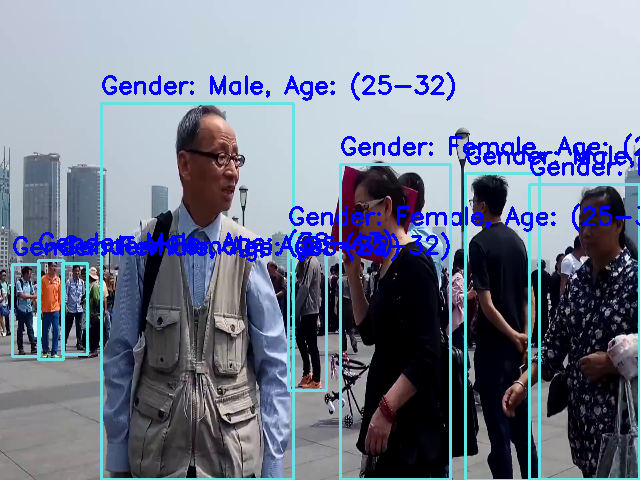

Frame 0: Detected 8 persons.

0: 480x640 7 persons, 9.2ms
Speed: 1.9ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


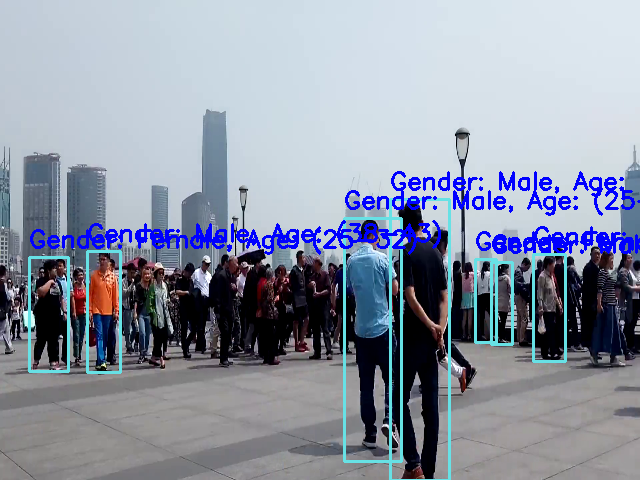

Frame 6: Detected 7 persons.

0: 480x640 9 persons, 10.1ms
Speed: 1.9ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


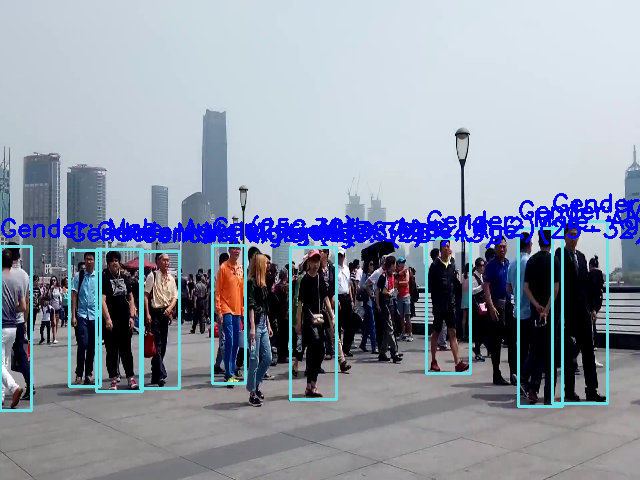

Frame 12: Detected 9 persons.

0: 480x640 13 persons, 15.1ms
Speed: 2.0ms preprocess, 15.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


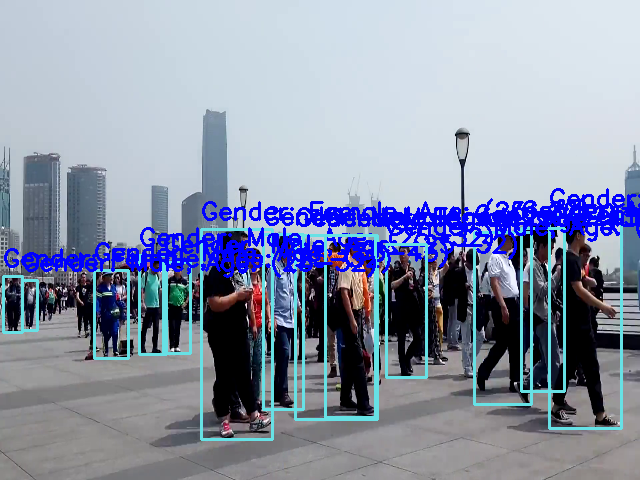

Frame 18: Detected 13 persons.

0: 480x640 10 persons, 11.0ms
Speed: 14.6ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


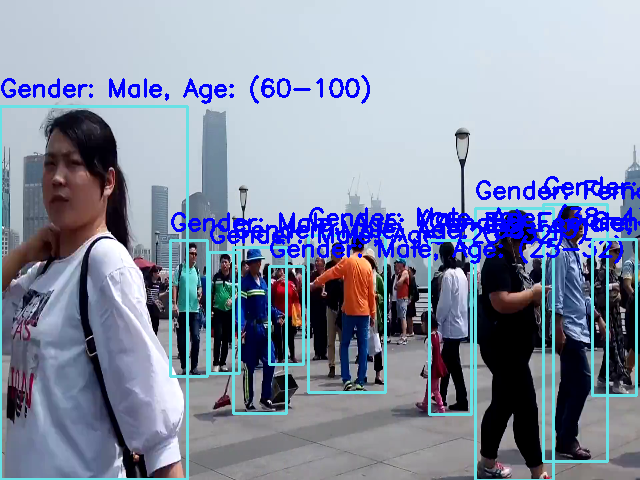

Frame 24: Detected 10 persons.

0: 480x640 12 persons, 18.9ms
Speed: 2.2ms preprocess, 18.9ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


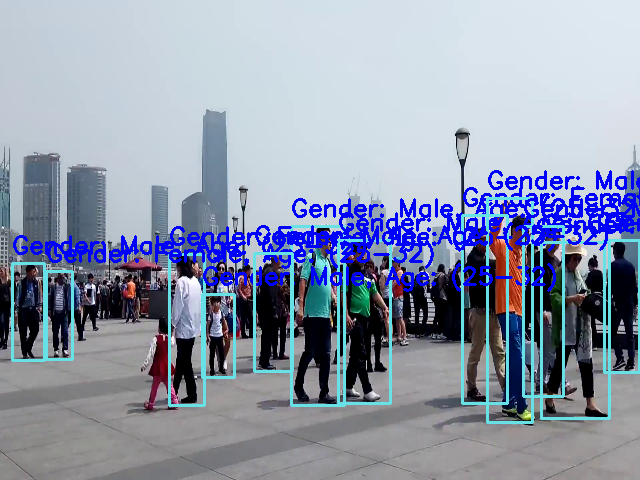

Frame 30: Detected 12 persons.

0: 480x640 9 persons, 17.7ms
Speed: 17.5ms preprocess, 17.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


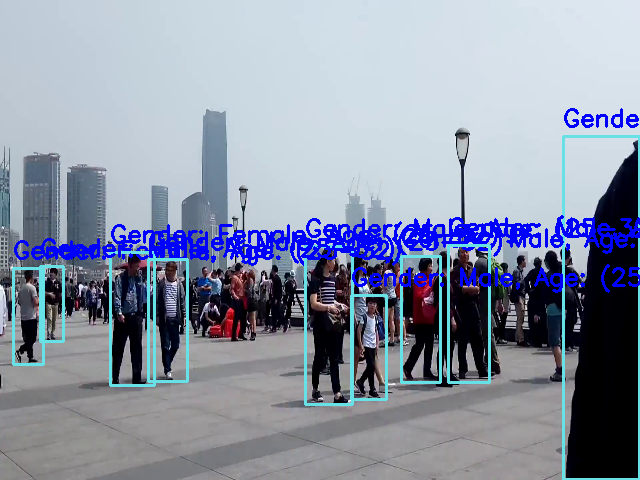

Frame 36: Detected 9 persons.

0: 480x640 13 persons, 20.0ms
Speed: 2.2ms preprocess, 20.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


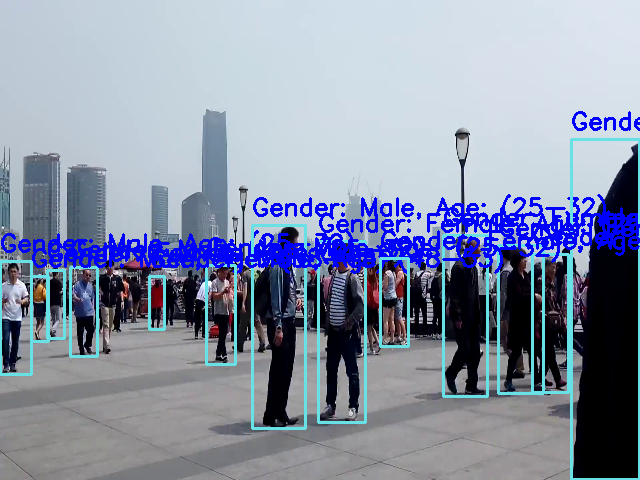

Frame 42: Detected 13 persons.

0: 480x640 5 persons, 27.9ms
Speed: 1.9ms preprocess, 27.9ms inference, 5.9ms postprocess per image at shape (1, 3, 480, 640)


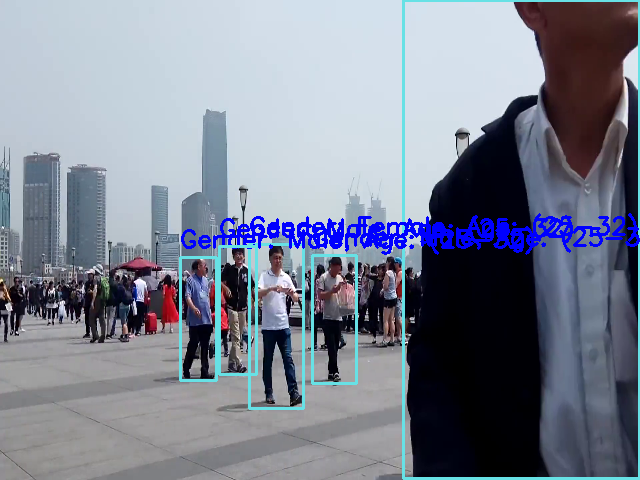

Frame 48: Detected 5 persons.
True Positives: 76
False Positives: 10
False Negatives: 10
Precision: 0.88
Recall: 0.88
F1-Score: 0.88
Total Males Detected: 62
Total Females Detected: 24


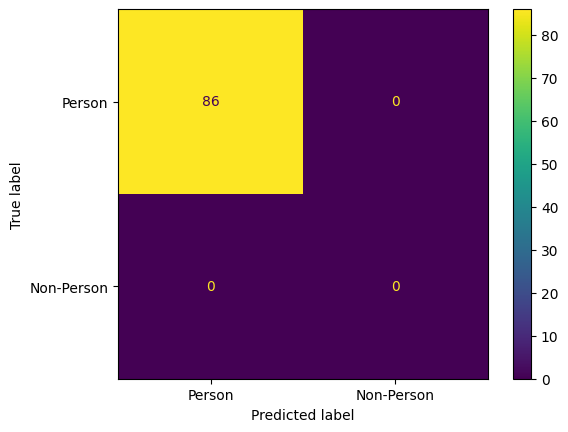

In [13]:
!pip install ultralytics opencv-python-headless scikit-learn matplotlib

import numpy as np
import cv2
from ultralytics import YOLO
import random
import time
import os
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Create a folder for saving person images if it doesn't exist
os.makedirs("detect", exist_ok=True)

# Load COCO classes file (adjust the path if using Google Drive)
my_file = open("/content/coco.txt", "r")
data = my_file.read()
class_list = data.split("\n")
my_file.close()

# Generate random colors for class list
detection_colors = []
for i in range(len(class_list)):
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    detection_colors.append((b, g, r))

# Load a pretrained YOLOv8n model
model = YOLO("/content/yolov8n.pt", "v8")

# Resize parameters for faster processing
frame_wid = 640
frame_hyt = 480

# Load gender and age models
FACE_PROTO = "/content/opencv_face_detector.pbtxt"
FACE_MODEL = "/content/opencv_face_detector_uint8.pb"
AGE_PROTO = "/content/age_deploy.prototxt"
AGE_MODEL = "/content/age_net.caffemodel"
GENDER_PROTO = "/content/gender_deploy.prototxt"
GENDER_MODEL = "/content/gender_net.caffemodel"
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
AGELIST = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
GENDERLIST = ['Male', 'Female']

# Load Networks
face_net = cv2.dnn.readNetFromTensorflow(FACE_MODEL, FACE_PROTO)
age_net = cv2.dnn.readNet(AGE_MODEL, AGE_PROTO)
gender_net = cv2.dnn.readNet(GENDER_MODEL, GENDER_PROTO)

# Open video
cap = cv2.VideoCapture("/content/vedio.mp4")

if not cap.isOpened():
    print("Cannot open video")
    exit()

fps = 5  # Frames per second (extract 2 frames per second)
total_duration = 10  # Process only the first 10 seconds
total_frames = fps * total_duration  # Total frames to process
frame_interval = int(cap.get(cv2.CAP_PROP_FPS) / fps)  # Interval between frames to skip

padding = 20
frame_count = 0

# Initialize counters for male and female counts
total_male_count = 0
total_female_count = 0

# Initialize detection metrics
true_positives = 0
false_positives = 0
false_negatives = 0
ground_truth_count = 0

# To store predictions and ground truth for confusion matrix
predicted_labels = []
ground_truth_labels = []

while frame_count < total_frames:
    ret, frame = cap.read()
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break

    # Skip frames to achieve desired fps (2 frames per second)
    if frame_count % frame_interval == 0:
        # Resize frame for faster processing
        frame = cv2.resize(frame, (frame_wid, frame_hyt))

        # YOLO Prediction on current frame
        detect_params = model.predict(source=[frame], conf=0.45, save=False)

        # Get detection data
        DP = detect_params[0].cpu().numpy()

        person_count = 0  # To count the number of persons

        if len(DP) != 0:
            for i in range(len(detect_params[0])):  # Loop through detected objects
                boxes = detect_params[0].boxes
                box = boxes[i]  # Get box info for each detected object
                clsID = box.cls.cpu().numpy()[0]  # Class ID
                conf = box.conf.cpu().numpy()[0]  # Confidence score
                bb = box.xyxy.cpu().numpy()[0]  # Bounding box coordinates

                ground_truth_labels.append(1)  # Assuming actual ground truth is always 'person'

                if class_list[int(clsID)] == 'person':  # Process only persons
                    person_count += 1
                    ground_truth_count += 1  # Increment ground truth persons count
                    predicted_labels.append(1)  # YOLO predicted 'person'

                    # Use confidence score for true/false positive classification
                    if conf >= 0.5:
                        true_positives += 1  # High confidence, correct detection
                    else:
                        false_positives += 1  # Low confidence, incorrect detection

                    # Extract detected person as an image
                    person_img = frame[int(bb[1]):int(bb[3]), int(bb[0]):int(bb[2])]

                    # Save detected person image
                    img_name = f"detect/person_{frame_count}_{i}.png"
                    cv2.imwrite(img_name, person_img)

                    # Use the saved person image for age and gender prediction
                    person_img = cv2.imread(img_name)
                    person_img_resized = cv2.resize(person_img, (227, 227))
                    blob = cv2.dnn.blobFromImage(person_img_resized, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)

                    # Gender Prediction
                    gender_net.setInput(blob)
                    gender_preds = gender_net.forward()
                    gender = GENDERLIST[gender_preds[0].argmax()]

                    # Age Prediction
                    age_net.setInput(blob)
                    age_preds = age_net.forward()
                    age = AGELIST[age_preds[0].argmax()]

                    label = f"Gender: {gender}, Age: {age}"

                    # Add text with predictions on the image
                    cv2.putText(frame, label, (int(bb[0]), int(bb[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

                    # Count gender and record age
                    if gender == 'Male':
                        total_male_count += 1
                    else:
                        total_female_count += 1

                    # Draw bounding box around the person
                    cv2.rectangle(frame, (int(bb[0]), int(bb[1])), (int(bb[2]), int(bb[3])), detection_colors[int(clsID)], 2)
                else:
                    predicted_labels.append(0)  # YOLO predicted 'non-person'
                    false_positives += 1  # Detected but not a person (FP)

        # Display the resulting frame with predictions
        cv2_imshow(frame)
        print(f"Frame {frame_count}: Detected {person_count} persons.")

        # Save the frame with bounding boxes and labels as an image
        frame_output_name = f"detect/frame_{frame_count}.png"
        cv2.imwrite(frame_output_name, frame)

    frame_count += 1

# Calculate False Negatives
false_negatives = ground_truth_count - true_positives

# Calculate Precision, Recall, and F1-Score
precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

# Print Detection Metrics
print(f"True Positives: {true_positives}")
print(f"False Positives: {false_positives}")
print(f"False Negatives: {false_negatives}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1_score:.2f}")
print(f"Total Males Detected: {total_male_count}")
print(f"Total Females Detected: {total_female_count}")

# Confusion Matrix
cm = confusion_matrix(ground_truth_labels, predicted_labels, labels=[1, 0])  # 1: person, 0: non-person
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Person", "Non-Person"])
disp.plot()

# Save Metrics to File
with open("detection_metrics.txt", "w") as f:
    f.write(f"True Positives: {true_positives}\n")
    f.write(f"False Positives: {false_positives}\n")
    f.write(f"False Negatives: {false_negatives}\n")
    f.write(f"Precision: {precision:.2f}\n")
    f.write(f"Recall: {recall:.2f}\n")
    f.write(f"F1-Score: {f1_score:.2f}\n")
    f.write(f"Total Males Detected: {total_male_count}\n")
    f.write(f"Total Females Detected: {total_female_count}\n")


In [ ]:
# Install required libraries
!pip install fastapi python-multipart uvicorn nest_asyncio

import numpy as np
import cv2
from ultralytics import YOLO
import random
import os
from fastapi import FastAPI, File, UploadFile
from fastapi.responses import JSONResponse
from pydantic import BaseModel
from typing import List, Optional
import shutil

# Load necessary models and configurations
class ObjectDetector:
    def __init__(self):
        # Load COCO classes
        my_file = open("/content/coco.txt", "r")
        self.class_list = my_file.read().split("\n")
        my_file.close()

        # Generate random colors
        self.detection_colors = []
        for i in range(len(self.class_list)):
            r = random.randint(0, 255)
            g = random.randint(0, 255)
            b = random.randint(0, 255)
            self.detection_colors.append((b, g, r))

        # Load models
        self.model = YOLO("/content/yolov8n.pt", "v8")

        # Load gender and age models
        self.face_net = cv2.dnn.readNetFromTensorflow(
            "/content/opencv_face_detector_uint8.pb",
            "/content/opencv_face_detector.pbtxt"
        )
        self.age_net = cv2.dnn.readNet(
            "/content/age_net.caffemodel",
            "/content/age_deploy.prototxt"
        )
        self.gender_net = cv2.dnn.readNet(
            "/content/gender_net.caffemodel",
            "/content/gender_deploy.prototxt"
        )

        # Constants
        self.MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
        self.AGELIST = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
        self.GENDERLIST = ['Male', 'Female']

        # Ensure detection folder exists
        os.makedirs("/content/detect", exist_ok=True)

    def detect_in_image(self, image_path):
        # Read image
        frame = cv2.imread(image_path)
        frame_resized = cv2.resize(frame, (640, 480))

        # Metrics tracking
        total_male_count = 0
        total_female_count = 0
        true_positives = 0
        false_positives = 0
        false_negatives = 0
        ground_truth_count = 0
        predicted_labels = []
        ground_truth_labels = []

        # Detect objects
        detect_params = self.model.predict(source=[frame_resized], conf=0.45, save=False)

        detection_results = []

        # Process detections
        if len(detect_params[0]) != 0:
            for i, boxes in enumerate(detect_params[0].boxes):
                clsID = boxes.cls.cpu().numpy()[0]
                conf = boxes.conf.cpu().numpy()[0]
                bb = boxes.xyxy.cpu().numpy()[0]

                ground_truth_labels.append(1)

                if self.class_list[int(clsID)] == 'person':
                    ground_truth_count += 1
                    predicted_labels.append(1)

                    # Extract person image
                    person_img = frame_resized[int(bb[1]):int(bb[3]), int(bb[0]):int(bb[2])]

                    # Save person image
                    img_name = f"/content/detect/person_{i}.png"
                    cv2.imwrite(img_name, person_img)

                    # Prepare for predictions
                    person_img_resized = cv2.resize(person_img, (227, 227))
                    blob = cv2.dnn.blobFromImage(
                        person_img_resized, 1.0, (227, 227),
                        self.MODEL_MEAN_VALUES, swapRB=False
                    )

                    # Gender Prediction
                    self.gender_net.setInput(blob)
                    gender_preds = self.gender_net.forward()
                    gender = self.GENDERLIST[gender_preds[0].argmax()]

                    # Age Prediction
                    self.age_net.setInput(blob)
                    age_preds = self.age_net.forward()
                    age = self.AGELIST[age_preds[0].argmax()]

                    # Count genders
                    if gender == 'Male':
                        total_male_count += 1
                    else:
                        total_female_count += 1

                    # Confidence-based metrics
                    if conf >= 0.5:
                        true_positives += 1
                    else:
                        false_positives += 1

                    # Prepare detection result
                    detection_results.append({
                        "gender": gender,
                        "age": age,
                        "confidence": float(conf)
                    })
                else:
                    predicted_labels.append(0)
                    false_positives += 1

        # Calculate metrics
        false_negatives = ground_truth_count - true_positives
        precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
        recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0
        f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

        return {
            "detections": detection_results,
            "metrics": {
                "total_male_count": total_male_count,
                "total_female_count": total_female_count,
                "true_positives": true_positives,
                "false_positives": false_positives,
                "false_negatives": false_negatives,
                "precision": precision,
                "recall": recall,
                "f1_score": f1_score
            }
        }

# Create FastAPI app
app = FastAPI()

# Initialize detector
detector = ObjectDetector()

@app.post("/detect")
async def detect_objects(file: UploadFile = File(...)):
    # Save uploaded file
    upload_dir = "/content/uploads"
    os.makedirs(upload_dir, exist_ok=True)
    file_path = os.path.join(upload_dir, file.filename)

    with open(file_path, "wb") as buffer:
        shutil.copyfileobj(file.file, buffer)

    try:
        # Perform detection
        results = detector.detect_in_image(file_path)
        return results
    except Exception as e:
        return JSONResponse(status_code=500, content={"error": str(e)})

# For running in Colab
import nest_asyncio
nest_asyncio.apply()

# Uncomment to run server
import uvicorn
uvicorn.run(app, host='0.0.0.0', port=8000)

print("FastAPI Server Configuration Complete!")
print("To start the server, uncomment the uvicorn.run() line")

INFO:     Started server process [4714]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


In [15]:
model.save("Age_and_Gender_with_matrix.pt")